# **A. Penjelasan Google Colab**
---







<center><img border="1" bordercolor="black" width="10%" alt ="" src="https://colab.research.google.com/img/colab_favicon_256px.png"><figcaption> </figcaption></center>

> **Colaboratory** atau kependekannya yaitu "**Colab**" merupakan product atau platform yang dibuat tim Google Research. Colab berlandaskan pada Jupyter Notebook yang memberikan kesempatan penulisan dan ekseksui kode python secara langsung pada browser.


>Google Colab dapat digunakan secara gratis oleh pengguna. Selain itu, pengguna turut mendapatkan akses terhadap *computing resources* dan GPUs secara terbatas. Namun, *resources* tersebut dinilai telah cukup untuk mendukung kegiatan* machine learning*, *data analysis*, pendidikan, sampai *image processing*.


> Kelebihan Google Colab:
1. Free GPU
2. Terintegrasi
3. Fleksibel
4. Mudah Dipahami



In [ ]:
## Hubungkan dan akses file pada Google Drive



# **B. Penjelasan Mask Region-CNN**
---



> Mask R-CNN adalah Convolutional Neural Network (CNN) yang secara khusus digunakan untuk image segmentation. Segmentasi citra merupakan varian dari Deep Neural Network yang mendeteksi objek pada suatu citra lalu melakukan segmentation mask pada setiap instance.
<br>
<center><img border="1" bordercolor="black" width="40%" alt ="" src="https://theaisummer.com/static/8b58a02198e13d2e29a41b40e7c6a035/14b42/semseg.jpg"><figcaption> Image Segmentation </figcaption></center>
</br>

Arsitektur CNN terdiri dari 3 layer utama yaitu:

  1. Convolutional Layer

      Layer yang berfungsi untuk melakukan abstraksi masukan citra sebagai feature map melalui metode filters dan kernels.
  2. Pooling Layer
      
      Layer ini berfungsi melakukan downsample feature map dengan meringkas keberadaan fitur
  3. Fully Connected Layer

      Layer yang menghubungkan atau mengkoneksikan setiap neuron pada satu layer ke setiap neuron pada layer lainnya.

<br>
<center><img border="1" bordercolor="black" width="40%" alt ="" src="https://viso.ai/wp-content/uploads/2021/03/cnn-convolutional-neural-networks.jpg"><figcaption> Arsitektur CNN </figcaption></center>
<br>

Mask R-CNN merupakan algoritma yang dibuat atau diciptakan menggunakan algoritma versi sebelumnya yaitu Faster R-CNN. 

Kelebihan dari Mask R-CNN yaitu sebagai berikut.


*   Kemudahan: Mask R-CNN dapat dengan mudah dilatih.
*   Performa: Mask R-CNN memberikan kemampuan single model processing pada setiap task
* Efisiensi
* Fleksibelitas

<br>
<center><img border="1" bordercolor="black" width="50%" alt ="" src="https://viso.ai/wp-content/uploads/2021/03/mask-r-cnn-framework-for-instance-segmentation-1.jpg"><figcaption> Arsitektur CNN </figcaption></center>
<br>










# **C. Detectron2 by Facebook**
---

<br>
<center><img border="1" bordercolor="black" width="40%" alt ="" src="https://raw.githubusercontent.com/facebookresearch/detectron2/main/.github/Detectron2-Logo-Horz.svg"><figcaption> </figcaption></center>
</br>

> Detectron2 merupakan kelanjutan versi pertama dari detectron yang berlandaskan pada Mask-RCNN benchmark. Platform detectron2 terimplementasi dengan PyTorch. FacebookAI selaku tim researcher yang mengembangkan platform objek deteksi secara open-source.

> Penggunaan detectron2 memberikan fleksibilitas dan extensibilitas yang mampu menyediakan *fast training* pada *single* atau *multiple* GPU. Sehingga, implementasi pada Mask R-CNN dinilai tepat dan mudah dalam pengembangannya dengan detectron2.

> Repositori Detectron2 https://github.com/facebookresearch/detectron2








## **1. Check GPU access**

---
> Terlebih dahulu, pastikan bahwa anda telah mengkoneksikan notebook dengan colab hardware. Anda akan mendapatkan alokasi RAM dan Disk seperti pada gambar berikut.

<img border="1" bordercolor="black" width="40%" alt ="" src="https://raw.githubusercontent.com/ctensz65/InstanceSegmentation/main/photos_colab/connectnotebook.jpg"><figcaption> </figcaption>

> Secara default, session pada Google Colab  telah menggunakan Python3 dan GPU acceleration. Namun, untuk memastikan bahwa GPU telah digunakan dalam session, lakukan langkah berikut.

>Pilih tab **Runtime -> Change runtime type**

>Pada dropdown **Hardware Accelaration**, pilih **GPU**

<img border="1" bordercolor="black" width="40%" alt ="" src="https://raw.githubusercontent.com/ctensz65/InstanceSegmentation/main/photos_colab/runtime.jpg"><figcaption> </figcaption>


In [ ]:
#@title Kode A1 - Validasi dengan nvidia-smi
!nvidia-smi

Wed Sep 14 18:25:05 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## **2. Instalasi Packages**

---




In [ ]:
#@title Kode A2 - Mount Google Drive

# mount user's Google Drive to Google Colab.
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#@title ### Kode A3 - Install Dependencies

# pyYaml version 5.1
!pip install pyyaml==5.1

# fvcore & cocoAPI
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

# Wget
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 34.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=6854c34e08dd96245674724e00d0455ee7ed899059bfd38a767693c960257697
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/

In [ ]:
#@title ### Kode A4 - Install Torch and Detectron2

import torch
import os

# Torch version 1.9.0 | cuda 11.1
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html

# Detectron2 
%cd /content/
!git clone https://github.com/facebookresearch/detectron2
!python -m pip install -e detectron2

!gcc --version

# Force session restart
exit(0)

TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("========================> Torch berhasil diinstall !")
print("========================> Detectron2 berhasil diinstall !")
print("Versi Torch: ", TORCH_VERSION, "; Versi CUDA: ", CUDA_VERSION)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.4 MB/s eta 0:14:36tcmalloc: large alloc 1147494400 bytes == 0x3ac74000 @  0x7f8ba5f9e615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████▌               | 1055.7 MB 1.5 MB/s eta 0:11:10tcmalloc: large alloc 1434370048 bytes == 0x7f2ca000 @  0x7f8ba5f9e615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████

/content
Cloning into 'detectron2'...
remote: Enumerating objects: 14545, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 14545 (delta 6), reused 17 (delta 6), pack-reused 14522
Receiving objects: 100% (14545/14545), 5.95 MiB | 25.08 MiB/s, done.
Resolving deltas: 100% (10516/10516), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2
     |████████████████████████████████| 106 kB 30.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 79 kB 9.0 MB/s 
     |████████████████████████████████| 151 kB 74.8 MB/s 
     |████████████████████████████████| 1.4 MB 56.9 MB/s 
     |████████████████████████████████| 509 kB 67.5 MB/s 
     |████████████████████████████████| 248 kB 72.6 MB/s 
  Installing build dependencies ..

In [ ]:
#@title Kode A5 - Import Detectron2

# Get Data
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import wget
import cv2
import os
import time
import shutil
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from datetime import datetime
from pathlib import Path

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer

# Colors for the warning messages
class bcolors:
  WARNING = '\033[31m'
  W  = '\033[0m'  # white (normal)
  R  = '\033[31m' # red
 
# Disable some of the tensorflow warnings
import warnings
warnings.filterwarnings("ignore")

## **3. Datasets**

---

Berikut merupakan contoh nama kustom dataset yang diperbolehkan. 
> 1.   my_dataset
2.   komponen
3.   objek
4.   buah

Tidak diperkenankan mengisikan nama dataset dengan spasi ataupun simbol karakter unik seperti "-". Berikut contoh nama dataset yang tidak diperkenankan.
> 1.   Dataset-12
2.   buah\n21
3.   komponen 91

```nama_filezip```: Nama dari dataset yang berformatkan zip

```full_path```: Path file dari datasets dalam format zip. 
Pilih dan klik kanan pada file zip di Google Drive anda untuk menyalin path file.

```jumlah_objek```: Banyak objek atau class pada dataset







In [ ]:
#@title Kode A6 - Unggah datasets dalam format zip
#@markdown ---

import shutil
nama_filezip = "Skenario2" #@param {type:"string"}
full_path = "/content/gdrive/MyDrive/Colab Notebooks/Sharable/Skenario2.zip" #@param {type:"string"}
jumlah_objek = 3 #@param {type:"number"}

target = r'/content/dataset.zip'
shutil.copyfile(full_path, target)

!unzip /content/dataset.zip
!rm -r /content/dataset.zip

%cd /content/
!rm -r dataset
os.rename(nama_filezip, "dataset")

print("========================> Dataset berhasil diunggah !")
!ls /content/dataset/

datasetfold = "/content/dataset"

Archive:  /content/dataset.zip
  inflating: Skenario2/train.json    
   creating: Skenario2/train/
  inflating: Skenario2/train/20220705_091317088_iOS.jpg  
  inflating: Skenario2/train/20220705_091317088_iOS.json  
  inflating: Skenario2/train/20220705_091319190_iOS.jpg  
  inflating: Skenario2/train/20220705_091319190_iOS.json  
  inflating: Skenario2/train/20220705_091321926_iOS.jpg  
  inflating: Skenario2/train/20220705_091321926_iOS.json  
  inflating: Skenario2/train/20220705_091333936_iOS.jpg  
  inflating: Skenario2/train/20220705_091333936_iOS.json  
  inflating: Skenario2/train/20220705_091336520_iOS.jpg  
  inflating: Skenario2/train/20220705_091336520_iOS.json  
  inflating: Skenario2/train/20220705_091338956_iOS.jpg  
  inflating: Skenario2/train/20220705_091338956_iOS.json  
  inflating: Skenario2/train/20220705_091351231_iOS.jpg  
  inflating: Skenario2/train/20220705_091351231_iOS.json  
  inflating: Skenario2/train/20220705_091354117_iOS.jpg  
  inflating: Skenario2/t

In [ ]:
#@title Kode A7 - Registrasi datasets

#@markdown ---

#@markdown Checklist jika hendak menggunakan nama default untuk datasets

default_name_dataset = True#@param {type:"boolean"}

#@markdown Jika sebaliknya, masukan nama kustom untuk dataset

custom_name_dataset = "" #@param {type:"string"}

from detectron2.data.datasets import register_coco_instances

if default_name_dataset:
  for d in ["train", "val"]:      
      register_coco_instances(f"dataset_{d}", {}, f"{datasetfold}/{d}.json", f"{datasetfold}/{d}")
  traindataset = "dataset_train"
  valdataset = "dataset_val"

else:
  flagspasi = True
  if custom_name_dataset.isspace():
    print("Error, penggunaan spasi dan simbol dilarang!")
    custom_name_dataset = ""
    flagspasi = False

  if flagspasi:
    # Proses registrasi
    # train, val sesuai nama file JSON nya ya
    for d in ["train", "val"]:      
        register_coco_instances(f"{custom_name_dataset}_{d}", {}, f"{datasetfold}/{d}.json", f"{datasetfold}/{d}")
    traindataset = custom_name_dataset + "_train"
    valdataset = custom_name_dataset + "_val"

print("========================> Dataset berhasil diregistrasi !")
print("========================> Registered training dataset : ", traindataset)
print("========================> Registered validasi dataset : ", valdataset)


========================> Dataset berhasil diregistrasi !
========================> Registered training dataset :  dataset_train
========================> Registered validasi dataset :  dataset_val


WARNING [09/14 18:51:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/14 18:51:05 d2.data.datasets.coco]: Loaded 245 images in COCO format from /content/dataset/train.json


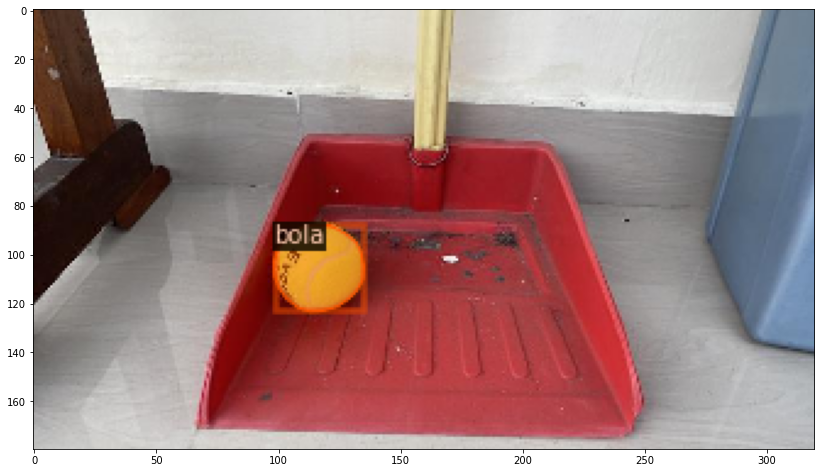

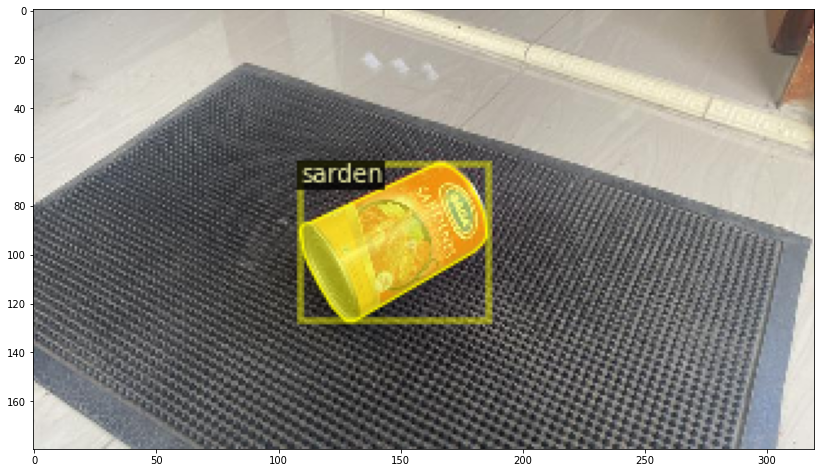

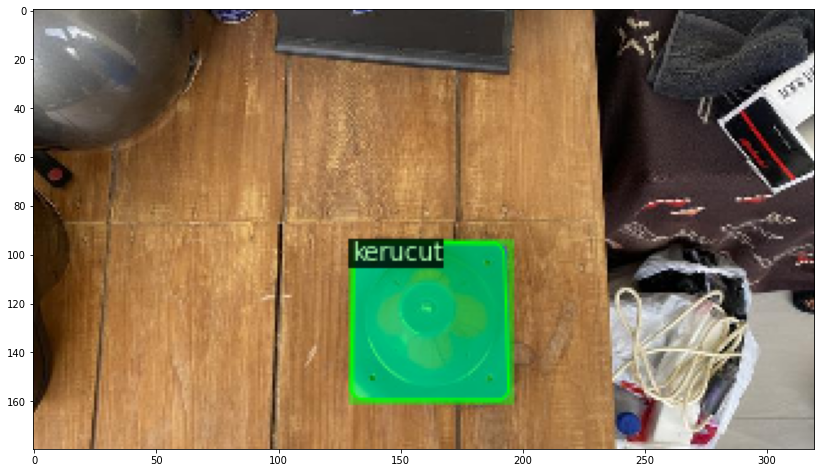

In [ ]:
#@title Kode A8 - Visualisasi datasets

import random
from detectron2.data import DatasetCatalog, MetadataCatalog

dataset_dicts = DatasetCatalog.get(traindataset)
test_metadata = MetadataCatalog.get(traindataset)

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=test_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
#@title Kode A9 - Save classes name

classes = test_metadata.get("thing_classes")

with open(r'/content/labels.txt', 'w') as fp:
    for item in classes:
        # write each item on a new line
        # fp.write("%s\n" % item)
        print(item, file=fp)
    print('Labels Saved!')

Labels Saved!


In [ ]:
#@markdown ###Print class ID

test_metadata.get("thing_dataset_id_to_contiguous_id")

{0: 0, 1: 1, 2: 2}

## **4. Training Data**

---

>Untuk pemula direkomendasikan untuk menggunakan konfigurasi parameter secara default yaitu **Advanced Parameters**.

>Namun, kustomasi parameter dapat dilakukan. Terlebih dahulu, matikan checklist pada **Advanced Parameter**. Anda dapat mengisikan value pada 3 form parameter yang telah disediakan. Anda dapat memodifikasi secara langsung pada kode jika hendak merubah parameter lainnya.

>**Hati-hati** dalam mengisikan value parameter dalam konfigurasi. Hal tersebut dapat berpengaruh langsung pada GPU, proses *training*, sampai keluaran model.

In [ ]:
#@title Kode A10 - Load config files
#@markdown ---
#@markdown Model Name:

model_name = "model1" #@param {type:"string"}
model_path = "output_trained_model"

full_model_path = model_path+'/'+model_name+'/'

#@markdown Advanced Parameters
default_advanced_parameters = True#@param {type:"boolean"}

#@markdown Customize Parameters:
batch_size =  4#@param {type:"number"}
initial_learning_rate = 0.001 #@param {type:"number"}
number_of_iteration =  2000#@param {type:"number"}

if (default_advanced_parameters): 
  print("========================> Default advanced parameters enabled")
  batch_size = 2
  initial_learning_rate = 0.00025
  number_of_iteration = 1000

start = time.time()

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = (traindataset,)
cfg.DATASETS.TEST = ()
cfg.OUTPUT_DIR = (full_model_path)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

#Copy the label names in the model folder
shutil.copy("/content/labels.txt", full_model_path+"labels.txt")

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = int(batch_size)
cfg.SOLVER.BASE_LR = initial_learning_rate
cfg.SOLVER.MAX_ITER = int(number_of_iteration)
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = int(jumlah_objek) # Jumlah classes

========================> Default advanced parameters enabled


In [ ]:
#@title ### Kode A11 - Start Training!

trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

#Save the config file after trainning
config = cfg.dump()  # print formatted configs
f = open(full_model_path+"/config.yaml", 'w') 
f.writelines(config) 
f.close()

dt = time.time() - start
mins, sec = divmod(dt, 60) 
hour, mins = divmod(mins, 60) 
print("========================> Selamat! proses training data telah selesai !")
print("========================> Time elapsed:",hour, "hour(s)",mins,"min(s)",round(sec),"sec(s)")

[09/14 19:05:59 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:04, 39.6MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[09/14 19:06:04 d2.engine.train_loop]: Starting training from iteration 0
[09/14 19:06:16 d2.utils.events]:  eta: 0:09:13  iter: 19  total_loss: 2.277  loss_cls: 1.432  loss_box_reg: 0.1388  loss_mask: 0.6952  loss_rpn_cls: 0.001981  loss_rpn_loc: 0.001686  time: 0.5593  data_time: 0.0246  lr: 4.9953e-06  max_mem: 2842M
[09/14 19:06:27 d2.utils.events]:  eta: 0:09:04  iter: 39  total_loss: 2.146  loss_cls: 1.302  loss_box_reg: 0.139  loss_mask: 0.6833  loss_rpn_cls: 0.0042  loss_rpn_loc: 0.002285  time: 0.5537  data_time: 0.0074  lr: 9.9902e-06  max_mem: 2842M
[09/14 19:06:39 d2.utils.events]:  eta: 0:09:01  iter: 59  total_loss: 1.811  loss_cls: 0.9996  loss_box_reg: 0.143  loss_mask: 0.6514  loss_rpn_cls: 0.005507  loss_rpn_loc: 0.002098  time: 0.5610  data_time: 0.0063  lr: 1.4985e-05  max_mem: 2842M
[09/14 19:06:50 d2.utils.events]:  eta: 0:08:54  iter: 79  total_loss: 1.471  loss_cls: 0.7335  loss_box_reg: 0.142  loss_mask: 0.6058  loss_rpn_cls: 0.002938  loss_rpn_loc: 0.001957  t

# **D. Evaluasi & Inteferensi Model**

---

## **1. Perhitungan loss function dengan tensorboard**

---
> Datasets yang akan di-*load* menggunakan dataset pada *trained-model* sebelumnya. Jika anda menggunakan model dengan dataset berbeda. Lakukan registrasi kembali terhadap dataset berbeda tersebut. Ikuti langkah pada **subab 3 datasets**

In [ ]:
#@title Kode B1
#@markdown Checklist jika perhitungan dilakukan pada model yang baru saja dilatih.
current_trained_model = True #@param {type:"boolean"}

#@markdown Jika perhitungan dilakukan pada model lain, masukan nama model beserta lokasi atau filepath dari model.

another_model_folder = "" #@param {type:"string"}

#Here we define the loaded model name and path
QC_model_name = os.path.basename(another_model_folder)
QC_model_path = os.path.dirname(another_model_folder)

if (current_trained_model): 
  QC_model_name = model_name
  QC_model_path = model_path

full_QC_model_path = QC_model_path+'/'+QC_model_name+'/'
if os.path.exists(full_QC_model_path):
  print("========================> The "+QC_model_name+" network will be evaluated")
else:  
  print(bcolors.WARNING + '!! WARNING: model tidak ditemukan !!')
  print('Pastikan anda memasukkan nama model dan lokasi dengan benar.')

%load_ext tensorboard
%tensorboard --logdir "$full_QC_model_path"

Output hidden; open in https://colab.research.google.com to view.

## **2. Error mapping dan estimasi quality metrics**

---
> Reference [mAP Reference](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173)



WARNING [09/14 20:11:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/14 20:11:32 d2.data.datasets.coco]: Loaded 245 images in COCO format from /content/dataset/train.json
[09/14 20:11:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
  

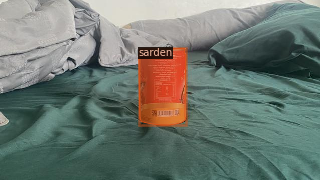


Hasil Prediksi


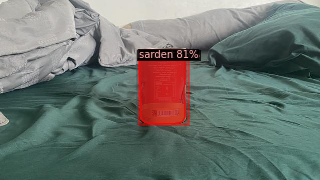


Ground Truth


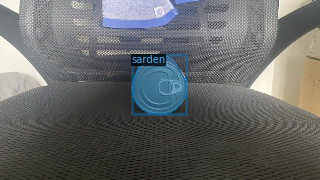


Hasil Prediksi


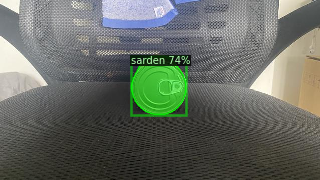

In [ ]:
#@title Kode B2 
#@markdown Komparasi antara Ground Truth dan Output Prediction

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

class CocoTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"
 
    return COCOEvaluator(dataset_name, cfg, False, output_folder)

#Load the model to use
cfg = get_cfg()
cfg.merge_from_file(full_QC_model_path+"config.yaml")
cfg.MODEL.WEIGHTS = os.path.join(full_QC_model_path, "model_final.pth")
cfg.DATASETS.TEST = (valdataset, )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = int(jumlah_objek)

#Metadata
test_metadata = MetadataCatalog.get(traindataset)
dataset_dicts = DatasetCatalog.get(traindataset)

# For the evaluation we need to load the trainer
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=True)

# Here we need to load the predictor
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator(valdataset, cfg, False, output_dir=QC_model_path+"/"+QC_model_name+"/Quality Control/Prediction")
val_loader = build_detection_test_loader(cfg, valdataset)
inference_on_dataset(trainer.model, val_loader, evaluator)

print("===========================================================")
print("========================> Result <========================>")
print("===========================================================")

for d in random.sample(dataset_dicts, 2):
    print("\nGround Truth")
    print("============")
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=test_metadata, instance_mode=ColorMode.SEGMENTATION, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

    print("\nHasil Prediksi")
    print("==============")
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
              metadata=test_metadata,
              instance_mode=ColorMode.SEGMENTATION, 
              scale=0.5
                )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

## **3. Inteferensi pada gambar**

---
> Pastikan dataset, jumlah class sesuai dengan model yang hendak digunakan. Hal tersebut dikarenkan metadata dari dataset yang diperlukan dalam proses prediksi.
Datasets yang akan di-load menggunakan dataset pada *trained model* sebelumnya. Jika anda menggunakan model dengan dataset berbeda. Lakukan registrasi kembali terhadap dataset berbeda tersebut.
Ikuti langkah pada subab **3 datasets**



========================> The new directory for result is created!
========================> Using current trained network
========================> The model1 network will be evaluated
[09/14 20:25:43 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean

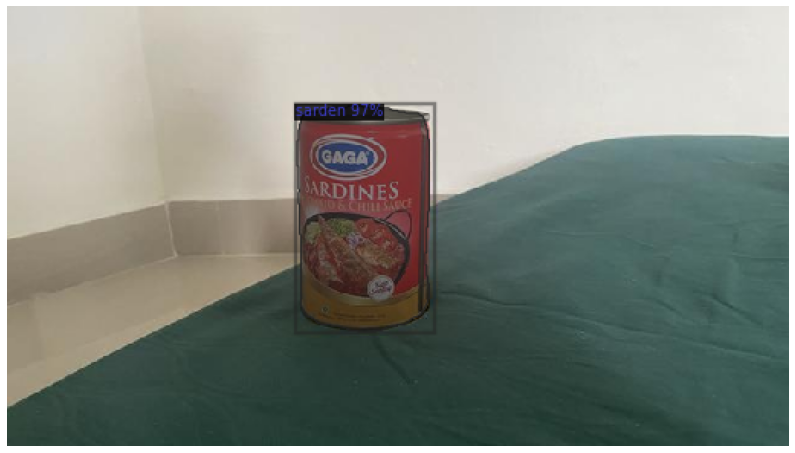

In [ ]:
import csv
import os

#@title Kode B3
#@markdown Masukan letak folder berisikan gambar yang hendak dilakukan prediksi
images_folder = "/content/gdrive/MyDrive/Colab Notebooks/val_folder/" #@param {type:"string"}

#@markdown Masukan path folder dari output prediksi
result_folder = "/content/hasil" #@param {type:"string"}

isExist = os.path.exists(result_folder)
if not isExist:
  # Create a new directory because it does not exist 
  os.makedirs(result_folder)
  print("========================> The new directory for result is created!")

#@markdown Checklist jika menggunakan model yang baru saja dilatih.
current_trained_model = True #@param {type:"boolean"}

#@markdown Jika menggunakan model lain, masukan lokasi folder model tersebut.
another_model_folder = "" #@param {type:"string"}

#Here we find the loaded model name and parent path
Prediction_model_name = os.path.basename(another_model_folder)
Prediction_model_path = os.path.dirname(another_model_folder)

if (current_trained_model): 
  print("========================> Using current trained network")
  Prediction_model_name = model_name
  Prediction_model_path = model_path

full_Prediction_model_path = Prediction_model_path+'/'+Prediction_model_name+'/'
if os.path.exists(full_Prediction_model_path):
  print("========================> The "+Prediction_model_name+" network will be evaluated")
else:  
  print(bcolors.WARNING + '!! WARNING: model tidak ditemukan !!')
  print('Pastikan anda memasukkan nama model dan lokasi dengan benar.')

list_of_labels_predictions = []
with open(full_Prediction_model_path+'labels.txt', newline='') as csvfile:
    reader = csv.reader(csvfile)
    for row in csv.reader(csvfile):
        list_of_labels_predictions.append(row[0])

# Create config
cfg = get_cfg()
cfg.merge_from_file(full_Prediction_model_path+"config.yaml")
cfg.MODEL.WEIGHTS = os.path.join(full_Prediction_model_path, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = int(jumlah_objek) 
predictor = DefaultPredictor(cfg)

test_metadata = MetadataCatalog.get(traindataset)

start = datetime.now()

validation_folder = Path(images_folder)

for i, file in enumerate(validation_folder.glob("*.jpg")):
    # this loop opens the .png files from the val-folder, creates a dict with the file
    # information, plots visualizations and saves the result as .pkl files.
    file = str(file)
    file_name = file.split("/")[-1]
    im = cv2.imread(file)

    #Prediction are done here
    outputs = predictor(im)

    #here we extract the results into numpy arrays
    classes_predictions = outputs["instances"].pred_classes.cpu().data.numpy()
    boxes_predictions = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    score_predictions = outputs["instances"].scores.cpu().data.numpy()
 
    #here we save the results into a csv file
    prediction_csv = result_folder+"/"+file_name+"_predictions.csv"

    with open(prediction_csv, 'w') as f:
      writer = csv.writer(f)
      writer.writerow(['x1','y1','x2','y2','box width','box height', 'class', 'score' ])    

      for i in range(len(boxes_predictions)):
        x1 = boxes_predictions[i][0]
        y1 = boxes_predictions[i][1]
        x2 = boxes_predictions[i][2]
        y2 = boxes_predictions[i][3]
        box_width = x2 - x1
        box_height = y2 -y1

        writer.writerow([str(x1), str(y1), str(x2), str(y2), str(box_width), str(box_height), str(list_of_labels_predictions[classes_predictions[i]]), score_predictions[i]])

# The last example is displayed   
v = Visualizer(im, metadata=test_metadata, instance_mode=ColorMode.SEGMENTATION, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))    
plt.figure(figsize=(14,10))
plt.imshow(v.get_image()[:, :, ::-1])
plt.axis('off');
plt.savefig(result_folder+"/"+file_name)
    
print("========================> Time needed for inferencing:", datetime.now() - start)


In [ ]:
#@markdown Delete Multiple Files

!sudo apt-get install rdfind
!rdfind -deleteduplicates true /content/hasil

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  rdfind
0 upgraded, 1 newly installed, 0 to remove and 32 not upgraded.
Need to get 45.8 kB of archives.
After this operation, 131 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 rdfind amd64 1.3.5-1 [45.8 kB]
Fetched 45.8 kB in 0s (143 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigu

## **4. Inteferensi pada gambar menggunakan *real-time* webcam**

---

In [ ]:
#@markdown Checklist jika menggunakan model yang baru saja dilatih.
current_trained_model = True #@param {type:"boolean"}

#@markdown Jika menggunakan model lain, masukan lokasi folder model tersebut.
another_model_folder = "" #@param {type:"string"}

#Here we find the loaded model name and parent path
Prediction_model_name = os.path.basename(another_model_folder)
Prediction_model_path = os.path.dirname(another_model_folder)

if (current_trained_model): 
  print("========================> Using current trained network")
  Prediction_model_name = model_name
  Prediction_model_path = model_path

full_Prediction_model_path = Prediction_model_path+'/'+Prediction_model_name+'/'
if os.path.exists(full_Prediction_model_path):
  print("========================> The "+Prediction_model_name+" network will be evaluated")
else:  
  print(bcolors.WARNING + '!! WARNING: model tidak ditemukan !!')
  print('Pastikan anda memasukkan nama model dan lokasi dengan benar.')

# Create config
cfg = get_cfg()
cfg.merge_from_file(full_Prediction_model_path+"config.yaml")
cfg.MODEL.WEIGHTS = os.path.join(full_Prediction_model_path, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = int(jumlah_objek) 
predictor = DefaultPredictor(cfg)

test_metadata = MetadataCatalog.get(traindataset)

from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  im = js_to_image(data)   
  # save image
  cv2.imwrite(filename, im)

  return filename

========================> Using current trained network
========================> The model1 network will be evaluated
[09/14 20:32:10 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) 

<IPython.core.display.Javascript object>

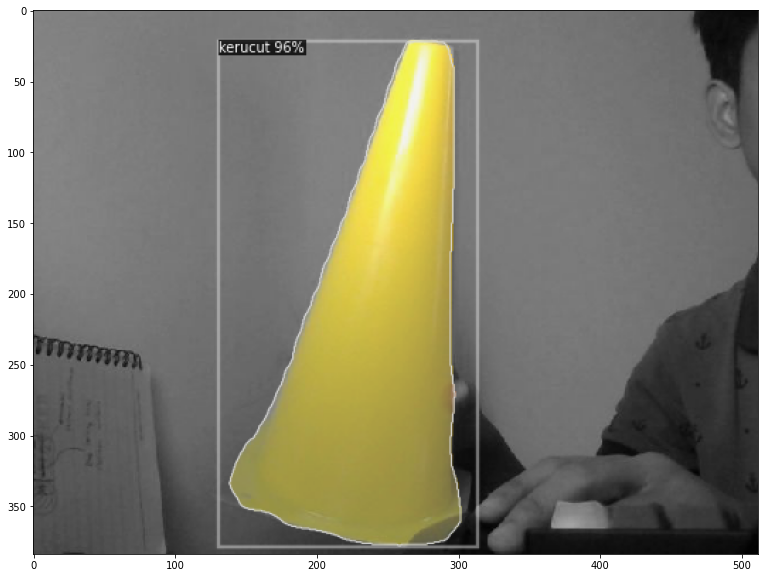

In [ ]:
#@title ###Kode B4 - Capture!
from IPython.display import Image
from detectron2.data.detection_utils import read_image
import glob

Result_folder = 'hasil'
file_name = 'result.jpg'

isExist = os.path.exists(Result_folder)
if not isExist:
  os.makedirs(Result_folder, exist_ok=True)

try:
  filename = take_photo()
  img = read_image(filename, format="BGR") 
  outputs = predictor(img)
  v = Visualizer(img[:, :, ::-1],
                  metadata=test_metadata, 
                  scale=0.8, 
                  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
  )
  vis = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  plt.figure(figsize = (14, 10))
  plt.imshow(cv2.cvtColor(vis.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
  vis.save(Result_folder+"/"+file_name)
  # plt.savefig(Result_folder+"/"+file_name)
  plt.show()

  # print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  # display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

## **5. Inteferensi pada video**

---

Interferensi pada Video dapat dijalankan secara local. Dengan script python default yang telah disediakan oleh detectron2.

Script demo.py dan predictor.py dapat diunduh pada [link](https://github.com/ctensz65/InstanceSegmentation/tree/main/codes) ini

Adapun, mahasiswa terlebih dahulu perlu menginstal dependancy package secara local pada komputer atau laptop.

Command untuk menjalankan inteferensi pada video yaitu.


```
python demo.py --config-file 'pathtoconfigsfile' 
--video-input 'pathtovideo' \
--model 'pathtomodel' \
--confidence-threshold 0.5 \
--output 'foldersavehasil' \
```
`output` path untuk menyimpak hasil *processing* atau deteksi pada video.

`video-input` path dari video yang hendak dilakukan inteferensi.

`config-file` path dari configs file untuk proses deteksi Mask RCNN

`model` path dari *trained model* untuk proses deteksi Mask RCNN



## **6. Inteferensi pada video menggunakan *real-time* webcam**

---

Interferensi secara real-time webcam dapat dijalankan secara local. Dengan menggunakan *default python script* yang telah disediakan oleh detectron2.

Script demo.py dan predictor.py dapat diunduh pada [link](https://github.com/ctensz65/InstanceSegmentation/tree/main/codes) ini

Adapun, mahasiswa terlebih dahulu perlu menginstal dependancy package secara local pada komputer atau laptop.

Command untuk menjalankan inteferensi secara *realtime* yaitu sebagai berikut.


```
python demo.py --config-file 'pathtoconfigsfile' 
--webcam \
--model 'pathtomodel' \
--confidence-threshold 0.5 \
```
`webcam` flag untuk menampilkan inteferensi secara *realtime video*.

`config-file` path dari configs file untuk proses deteksi Mask RCNN

`model` path dari *trained model* untuk proses deteksi Mask RCNN
